In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
import imgaug as ia
from imgaug import augmenters as iaa
%matplotlib inline

def cv2mpl(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def solidity(cnt):
    area = cv2.contourArea(cnt)
    hull = np.int0(cv2.boxPoints(cv2.minAreaRect(cnt)))
    hull_area = cv2.contourArea(hull)
    if hull_area > 0.03:
        solidity = float(area) / hull_area
        return solidity
    else:
        return 0.0

In [3]:
def pipeline(img):
    s = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)[:,:,1]
    _, thresh = cv2.threshold(s.copy(), 100, 255, cv2.THRESH_BINARY)
    im2, contours2, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
    cg = [c for c in contours2 if cv2.contourArea(c) > 1700 and cv2.contourArea(c) < 2750]
    cg = [c for c in cg if solidity(c) > 0.8]
    boundingRects = [np.int0(cv2.boxPoints(cv2.minAreaRect(c))) for c in cg]
    boundingBoxes = [cv2.boundingRect(c) for c in cg]
    boundingBoxes = [((x - 10, y - 10), (x+w + 10, y+h + 10)) for x, y, w, h in boundingBoxes]
    return boundingBoxes
    

In [4]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential(
    [
        iaa.Fliplr(0.5),
        iaa.Flipud(0.2),
        sometimes(iaa.CropAndPad(
            percent=(-0.05, 0.1),
            pad_mode=ia.ALL,
            pad_cval=(0, 255)
        )),
        sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
            rotate=(-15, 15),
            shear=(-10, 10),
            order=[0, 1],
            cval=(0, 255),
            mode=ia.ALL
        )),
        iaa.SomeOf((0, 5),
            [
                
                iaa.OneOf([
                    iaa.GaussianBlur((0, 3.0)), 
                    iaa.AverageBlur(k=(2, 7)), 
                    iaa.MedianBlur(k=(3, 11)), 
                ]),
                
                iaa.OneOf([
                    iaa.Dropout((0.01, 0.1), per_channel=0.5),
                ]),
                iaa.Invert(0.05, per_channel=True),
                iaa.Add((-10, 10), per_channel=0.5),
                iaa.AddToHueAndSaturation((-20, 20)),
                
                t
                iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5)
            ],
            random_order=True
        )
    ],
    random_order=True
)

In [5]:
images = [cv2.imread("TrainingData1/image{}.png".format(i)) for i in range(1, 21)]

In [6]:
new = seq.augment_images(images)


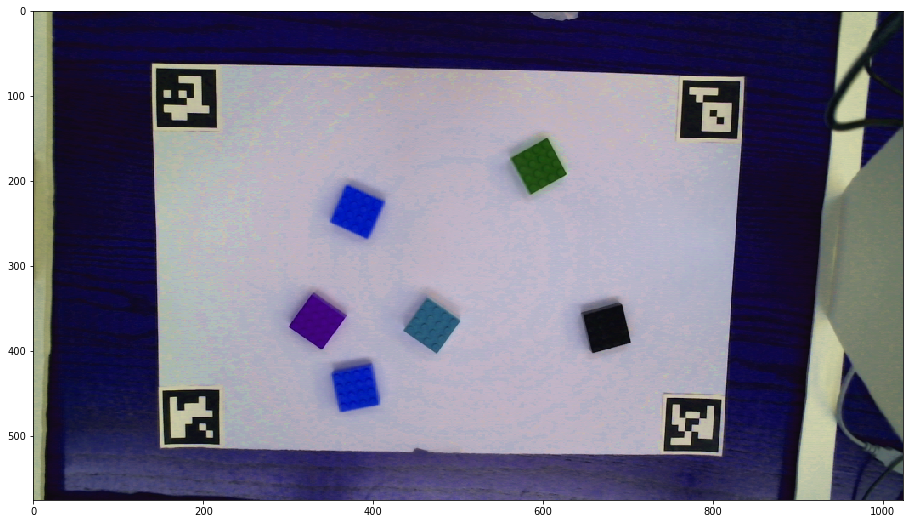

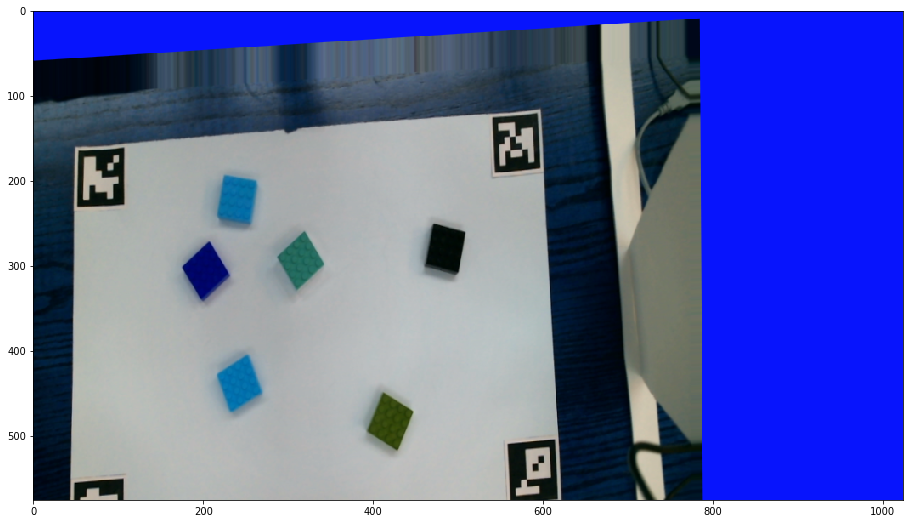

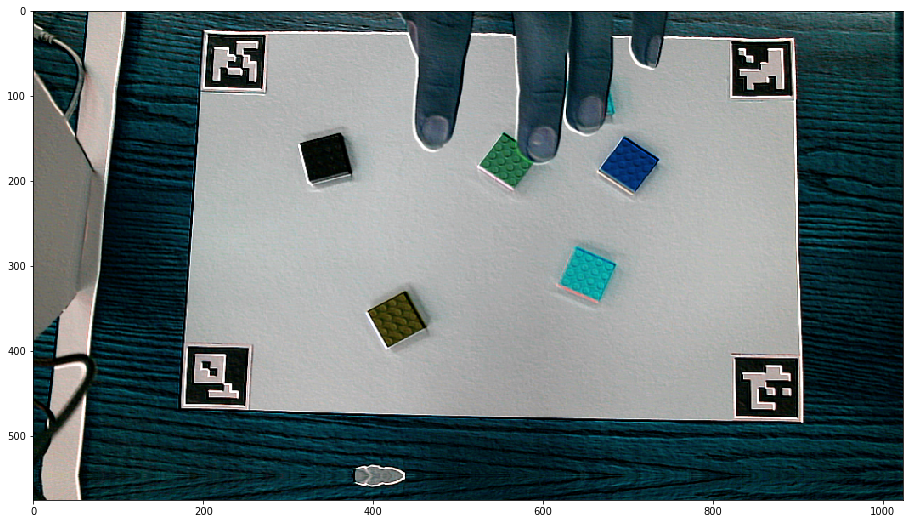

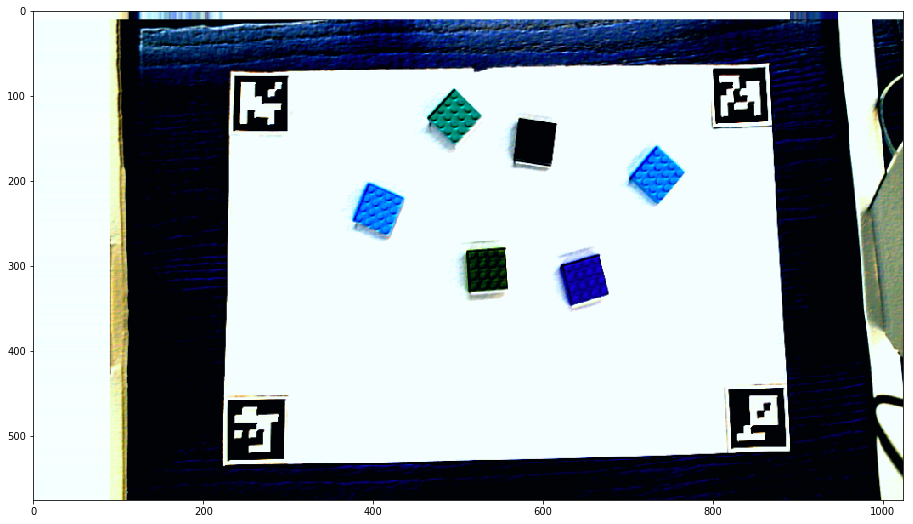

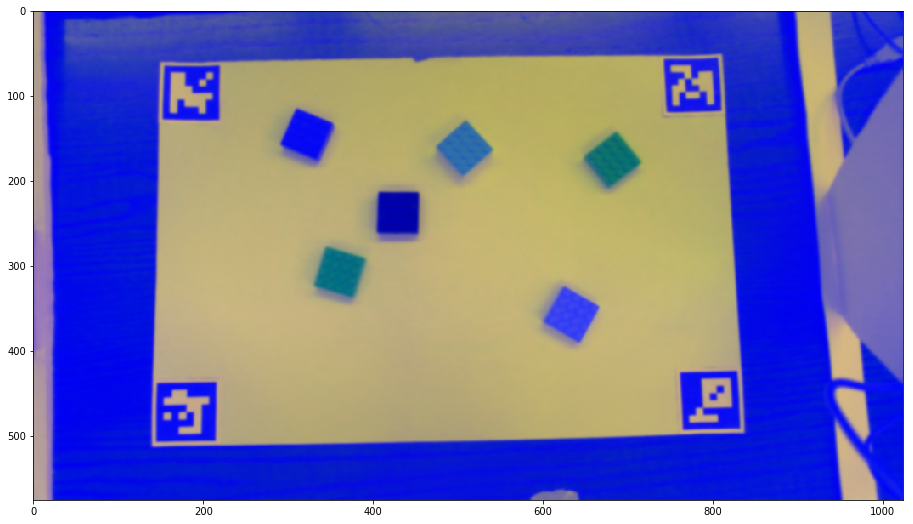

...

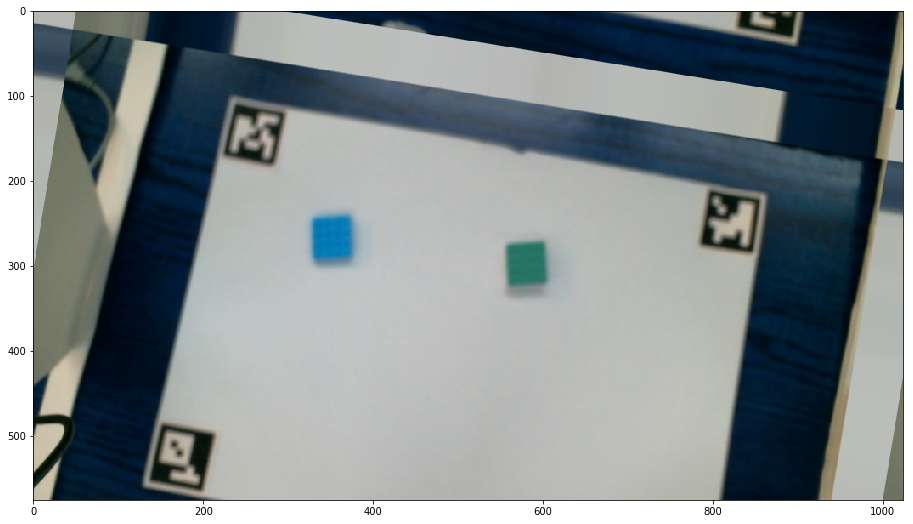

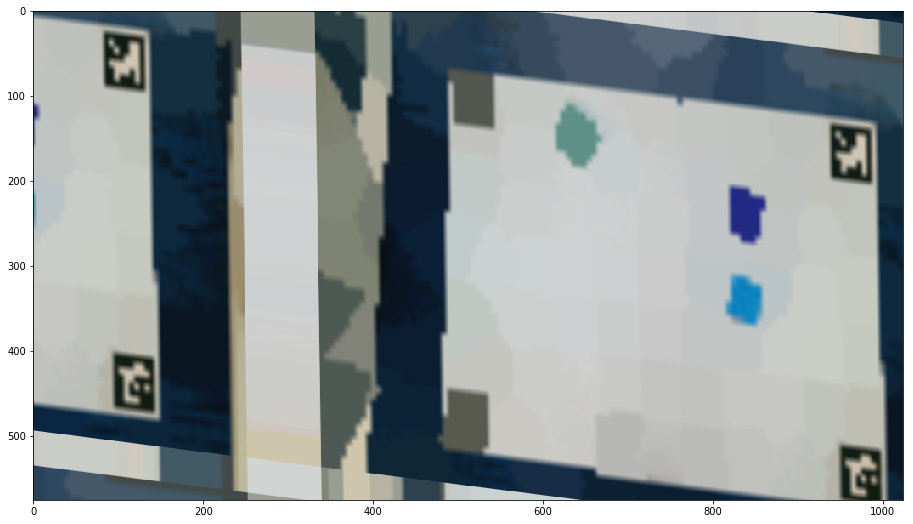

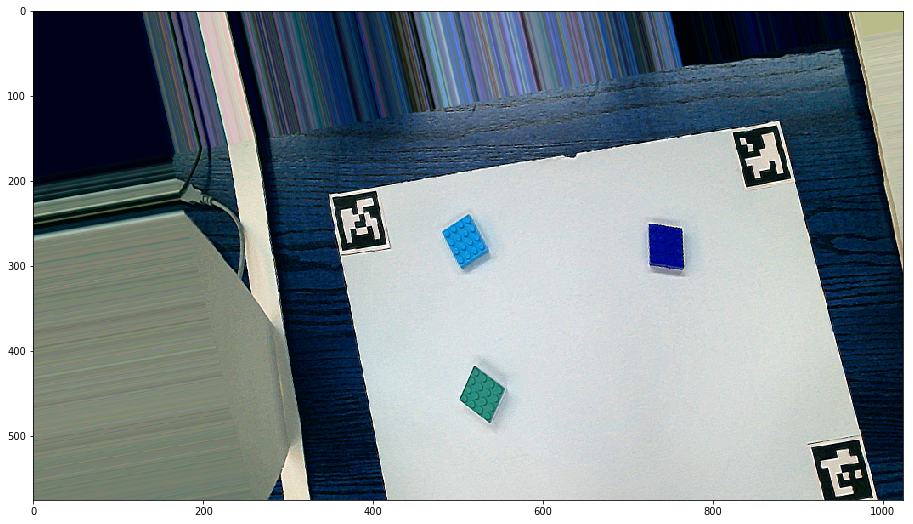

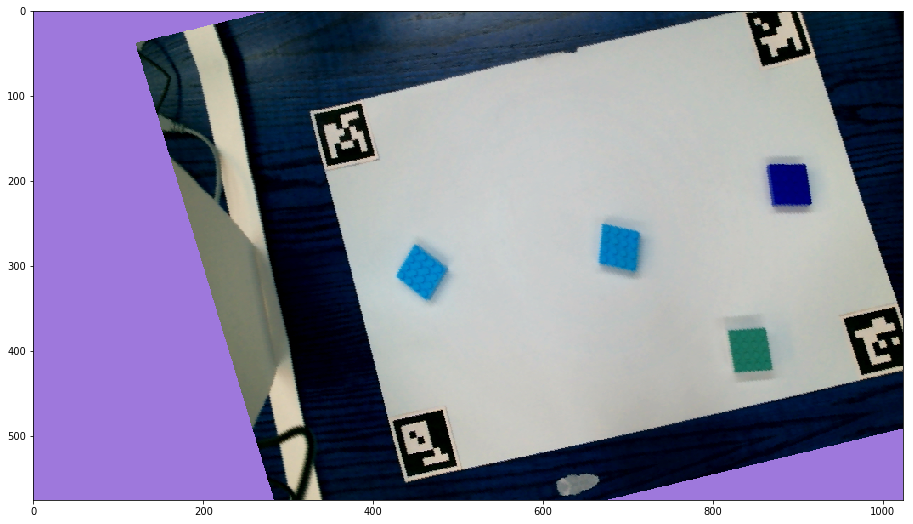

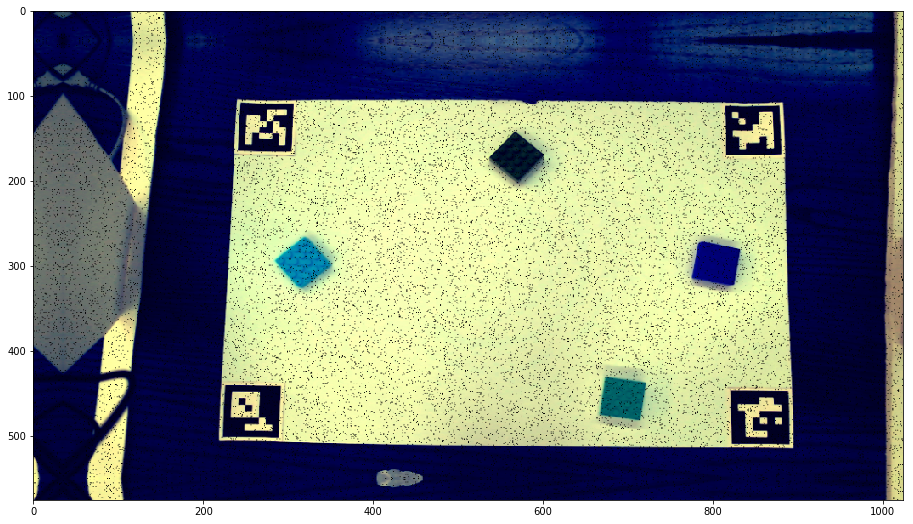

In [7]:
for i in new:
    plt.figure(figsize=(16, 9))
    plt.imshow(i)

In [5]:
for index in range(1, 20):
    image = cv2.imread("TrainingData1/image{}.png".format(index))
    i = image.copy()
    i = cv2.cvtColor(i, cv2.COLOR_BGR2RGB)
    print(i.shape)
    i = exposure.equalize_adapthist(i).astype(np.float32) * 255.0
    print(i[10,:])
    print(i.shape)
    i = cv2.cvtColor(i, cv2.COLOR_RGB2BGR)
    #for box in pipeline(image):
    #    cv2.rectangle(i, box[0], box[1], (0, 255, 0), 2)
    #plt.imshow(cv2mpl(i))
    cv2.imwrite("TrainingDataOut/image{}.png".format(index), i)

(576, 1024, 3)


/usr/local/miniconda3/miniconda3/envs/mlenv/lib/python3.5/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


[[196.56807   233.42459   236.1547   ]
 [196.56807   233.42459   236.1547   ]
 [196.56807   233.42459   236.1547   ]
 ...
 [ 73.388405   56.772163   24.924366 ]
 [ 58.387486   43.48004    14.907443 ]
 [ 48.517628   33.84951     7.8982186]]
(576, 1024, 3)
(576, 1024, 3)
[[201.15529   235.83725   239.99908  ]
 [201.15529   235.83725   239.99908  ]
 [201.15529   235.83725   239.99908  ]
 ...
 [ 76.36122    70.59811    40.341774 ]
 [ 60.81453    49.169193   11.645336 ]
 [ 49.119427   38.593838    4.6780405]]
(576, 1024, 3)
(576, 1024, 3)
[[198.96478   233.74884   237.92293  ]
 [201.11414   236.02977   240.21967  ]
 [203.90738   234.63315   240.21967  ]
 ...
 [ 78.354576   60.942444   27.569202 ]
 [ 57.99645    42.86694    11.347131 ]
 [ 46.49715    34.02231     4.5363073]]
(576, 1024, 3)
(576, 1024, 3)
[[190.37407   224.74718   234.00148  ]
 [190.37407   224.74718   234.00148  ]
 [189.07602   223.21474   229.77988  ]
 ...
 [ 74.83169    60.7125     26.826454 ]
 [ 57.116623   42.216637   11